In [16]:
cd ..

/root/object-detection/yolov5/SIFT


In [17]:
!pip install -r requirements.txt

Looking in indexes: http://mirrors.aliyun.com/pypi/simple


In [21]:
import cv2
import pickle
import matplotlib.pyplot as plt

# 利用cv2.resize对图像进行缩放

def imageResizeTrain(image):
    maxD = 1024
    height,width = image.shape
    aspectRatio = width/height
    if aspectRatio < 1:
        newSize = (int(maxD*aspectRatio),maxD)
    else:
        newSize = (maxD,int(maxD/aspectRatio))
    image = cv2.resize(image,newSize)
    return image

def imageResizeTest(image):
    maxD = 1024
    height,width,channel = image.shape
    aspectRatio = width/height
    if aspectRatio < 1:
        newSize = (int(maxD*aspectRatio),maxD)
    else:
        newSize = (maxD,int(maxD/aspectRatio))
    image = cv2.resize(image,newSize)
    return image

# 调用cv2.sift() 计算出keypoints 和 descriptors
sift = cv2.SIFT_create()
def computeSIFT(image):
    return sift.detectAndCompute(image, None)

In [22]:
# 数据集
imageList = []

for i in range(1, 104):
    filename = f"{i:03d}.jpg"
    imageList.append(filename)

print(imageList)

image_test_List = []

for i in range(1, 51):
    filename = f"{i:03d}.jpg"
    image_test_List.append(filename)

print(image_test_List)

['001.jpg', '002.jpg', '003.jpg', '004.jpg', '005.jpg', '006.jpg', '007.jpg', '008.jpg', '009.jpg', '010.jpg', '011.jpg', '012.jpg', '013.jpg', '014.jpg', '015.jpg', '016.jpg', '017.jpg', '018.jpg', '019.jpg', '020.jpg', '021.jpg', '022.jpg', '023.jpg', '024.jpg', '025.jpg', '026.jpg', '027.jpg', '028.jpg', '029.jpg', '030.jpg', '031.jpg', '032.jpg', '033.jpg', '034.jpg', '035.jpg', '036.jpg', '037.jpg', '038.jpg', '039.jpg', '040.jpg', '041.jpg', '042.jpg', '043.jpg', '044.jpg', '045.jpg', '046.jpg', '047.jpg', '048.jpg', '049.jpg', '050.jpg', '051.jpg', '052.jpg', '053.jpg', '054.jpg', '055.jpg', '056.jpg', '057.jpg', '058.jpg', '059.jpg', '060.jpg', '061.jpg', '062.jpg', '063.jpg', '064.jpg', '065.jpg', '066.jpg', '067.jpg', '068.jpg', '069.jpg', '070.jpg', '071.jpg', '072.jpg', '073.jpg', '074.jpg', '075.jpg', '076.jpg', '077.jpg', '078.jpg', '079.jpg', '080.jpg', '081.jpg', '082.jpg', '083.jpg', '084.jpg', '085.jpg', '086.jpg', '087.jpg', '088.jpg', '089.jpg', '090.jpg', '091.jpg'

In [23]:
# 数据集操作
imagesPath = []
for imageName in imageList:
    imagePath = "data/images/" + str(imageName)
    imagesPath.append(imageResizeTrain(cv2.imread(imagePath,0))) # flag 0 means grayscale


keypoints = []
descriptors = []
for i,image in enumerate(imagesPath):
    print("Starting for image: " + imageList[i])
    keypointTemp, descriptorTemp = computeSIFT(image)
    keypoints.append(keypointTemp)
    descriptors.append(descriptorTemp)
    print("  Ending for image: " + imageList[i])


print("-------------------------------------------")
# 测试集操作
images_test_Path = []
for imageName in image_test_List:
    imageTestPath = "data/test/" + str(imageName)
    images_test_Path.append(imageResizeTrain(cv2.imread(imageTestPath,0))) # flag 0 means grayscale


test_keypoints = []
test_descriptors = []
for i,image in enumerate(images_test_Path):
    print("Starting for image: " + image_test_List[i])
    keypointTemp, descriptorTemp = computeSIFT(image)
    test_keypoints.append(keypointTemp)
    test_descriptors.append(descriptorTemp)
    print("  Ending for image: " + image_test_List[i])

Starting for image: 001.jpg
  Ending for image: 001.jpg
Starting for image: 002.jpg
  Ending for image: 002.jpg
Starting for image: 003.jpg
  Ending for image: 003.jpg
Starting for image: 004.jpg
  Ending for image: 004.jpg
Starting for image: 005.jpg
  Ending for image: 005.jpg
Starting for image: 006.jpg
  Ending for image: 006.jpg
Starting for image: 007.jpg
  Ending for image: 007.jpg
Starting for image: 008.jpg
  Ending for image: 008.jpg
Starting for image: 009.jpg
  Ending for image: 009.jpg
Starting for image: 010.jpg
  Ending for image: 010.jpg
Starting for image: 011.jpg
  Ending for image: 011.jpg
Starting for image: 012.jpg
  Ending for image: 012.jpg
Starting for image: 013.jpg
  Ending for image: 013.jpg
Starting for image: 014.jpg
  Ending for image: 014.jpg
Starting for image: 015.jpg
  Ending for image: 015.jpg
Starting for image: 016.jpg
  Ending for image: 016.jpg
Starting for image: 017.jpg
  Ending for image: 017.jpg
Starting for image: 018.jpg
  Ending for image: 

In [24]:
bf = cv2.BFMatcher()
def calculateMatches(des1,des2):
    matches = bf.knnMatch(des1,des2,k=2)
    topResults1 = []
    for m,n in matches:
        if m.distance < 0.7*n.distance:
            topResults1.append([m])

    matches = bf.knnMatch(des2,des1,k=2)
    topResults2 = []
    for m,n in matches:
        if m.distance < 0.7*n.distance:
            topResults2.append([m])

    topResults = []
    for match1 in topResults1:
        match1QueryIndex = match1[0].queryIdx
        match1TrainIndex = match1[0].trainIdx

        for match2 in topResults2:
            match2QueryIndex = match2[0].queryIdx
            match2TrainIndex = match2[0].trainIdx

            if (match1QueryIndex == match2TrainIndex) and (match1TrainIndex == match2QueryIndex):
                topResults.append(match1)
    end_time = time.time()  # end time 
    return topResults


def calculateScore(matches,keypoint1,keypoint2):
    return 100 * (matches/min(keypoint1,keypoint2))

def getPlotFor(i,j,keypoint1,keypoint2,matches):
    image1 = imageResizeTest(cv2.imread("data/images/" + imageList[i]))
    image2 = imageResizeTest(cv2.imread("data/test/" + image_test_List[j]))
    return getPlot(image1,image2,keypoint1,keypoint2,matches)


def getPlot(image1,image2,keypoint1,keypoint2,matches):
    image1 = cv2.cvtColor(image1, cv2.COLOR_BGR2RGB)
    image2 = cv2.cvtColor(image2, cv2.COLOR_BGR2RGB)
    matchPlot = cv2.drawMatchesKnn(
        image1,
        keypoint1,
        image2,
        keypoint2,
        matches,
        None,
        [255,255,255],
        flags=2
    )
    return matchPlot


def getScore(i,j):
    keypoint1 = keypoints[i]
    descriptor1 = descriptors[i]
    keypoint2 = test_keypoints[j]
    descriptor2 = test_descriptors[j]
    matches = calculateMatches(descriptor1, descriptor2)
    score = calculateScore(len(matches),len(keypoint1),len(keypoint2))
    return score




def calculateResultsFor(i,j):
    keypoint1 = keypoints[i]
    descriptor1 = descriptors[i]
    keypoint2 = test_keypoints[j]
    descriptor2 = test_descriptors[j]
    matches = calculateMatches(descriptor1, descriptor2)
    score = calculateScore(len(matches),len(keypoint1),len(keypoint2))
    plot = getPlotFor(i,j,keypoint1,keypoint2,matches)
    print(len(matches),len(keypoint1),len(keypoint2),len(descriptor1),len(descriptor2))
    print(score)
    plt.imshow(plot),plt.show()

In [26]:
index = 0
score_array = []
# #  i 表示数据集的图片 0 -> 001.jpg  j 表示测试集的图片 0 -> 001.jpg
def getMaxScore(j):
    maxScore = 0
    global index
    for i in range(0,103):
        score = getScore(i,j)
        score_array.append(score)
        index  =  i if score > maxScore  else index
        maxScore = max(maxScore,score)
    return maxScore



12.962369895916733
Running time: 51.087685346603394 seconds
1619 14338 12490 14338 12490
12.962369895916733


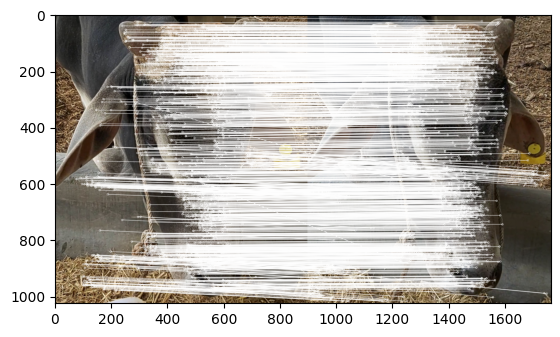

6.268841307876633
Running time: 60.16357707977295 seconds
811 14338 12937 14338 12937
6.268841307876633


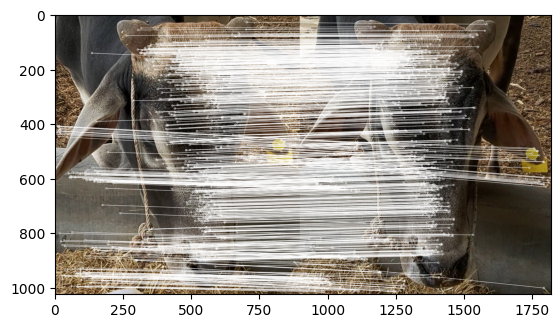

6.716282446905064
Running time: 58.60373091697693 seconds
740 11018 12631 11018 12631
6.716282446905064


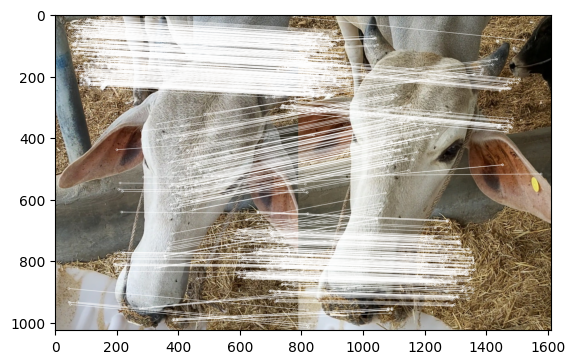

6.062021296469269
Running time: 52.65768218040466 seconds
649 11018 10706 11018 10706
6.062021296469269


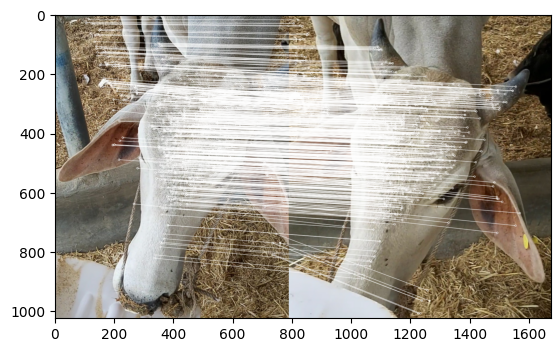

9.393719368306408
Running time: 81.86417508125305 seconds
1035 11018 12875 11018 12875
9.393719368306408


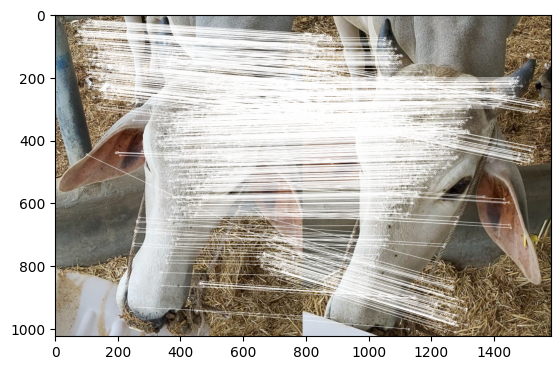

17.628010524185385
Running time: 68.21128940582275 seconds
871 4941 11767 4941 11767
17.628010524185385


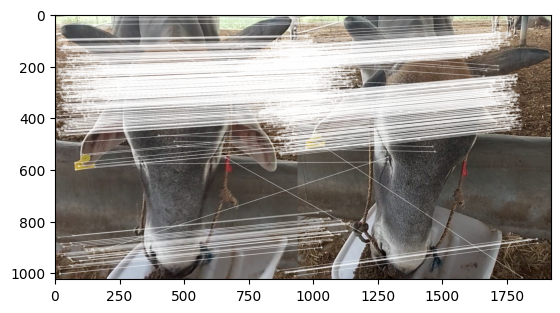

19.688083177819248
Running time: 50.375975608825684 seconds
1477 7502 9129 7502 9129
19.688083177819248


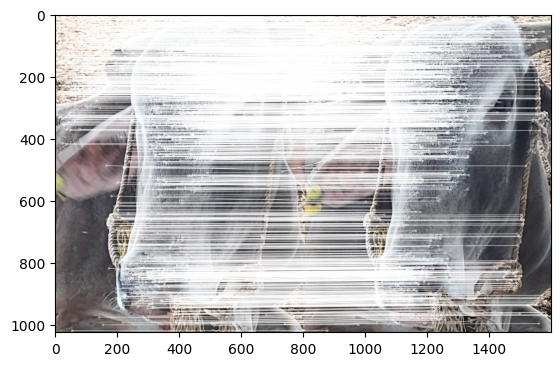

20.48911422606621
Running time: 51.96590566635132 seconds
687 3353 9599 3353 9599
20.48911422606621


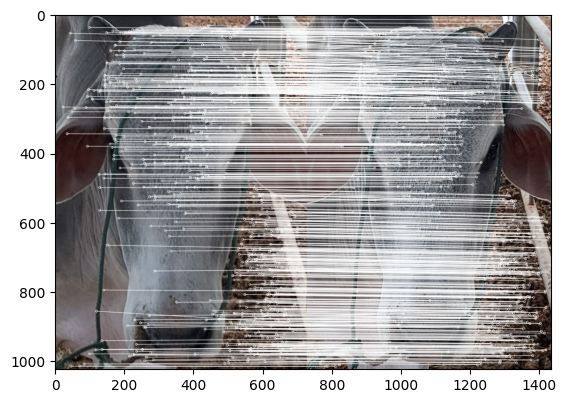

2.607494387843205
Running time: 32.34727454185486 seconds
151 6106 5791 6106 5791
2.607494387843205


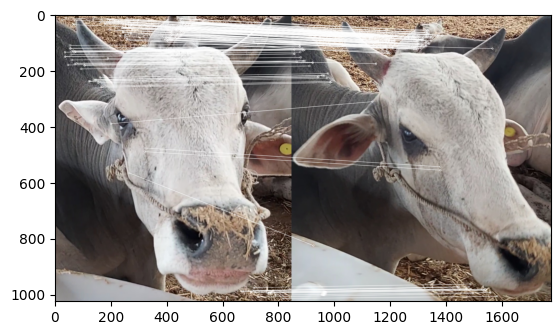

23.991969215325415
Running time: 40.49262976646423 seconds
1434 6106 5977 6106 5977
23.991969215325415


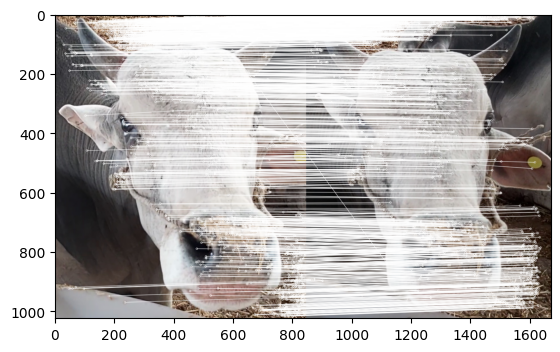

37.27308602999211
Running time: 70.54073858261108 seconds
3778 13080 10136 13080 10136
37.27308602999211


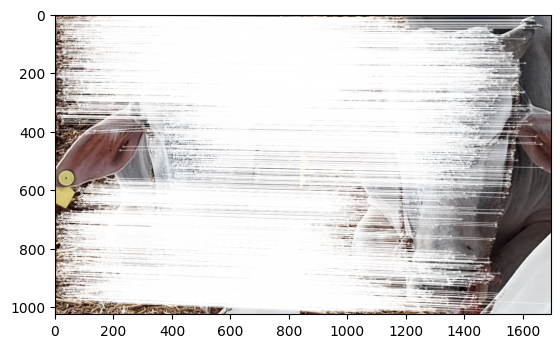

4.0472175379426645
Running time: 8.150226354598999 seconds
48 13080 1186 13080 1186
4.0472175379426645


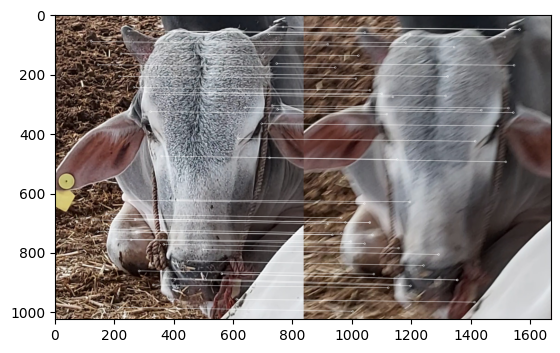

25.946913212048912
Running time: 46.478562355041504 seconds
870 3353 6742 3353 6742
25.946913212048912


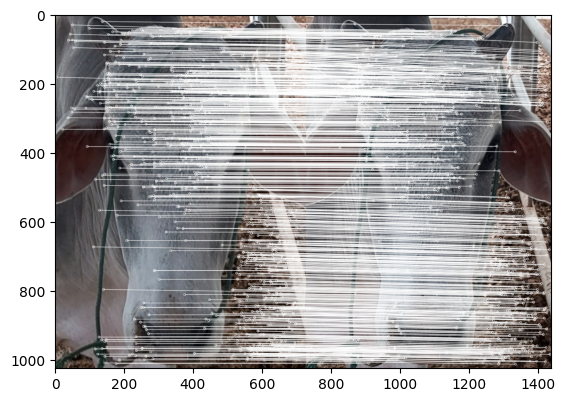

100.0
Running time: 31.317153930664062 seconds
4317 4317 4317 4317 4317
100.0


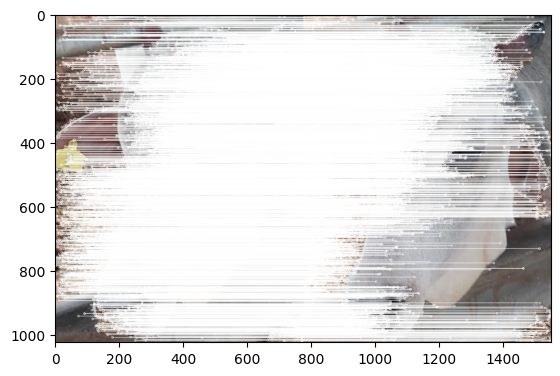

4.2622191336576325
Running time: 55.74699521064758 seconds
184 4317 8147 4317 8147
4.2622191336576325


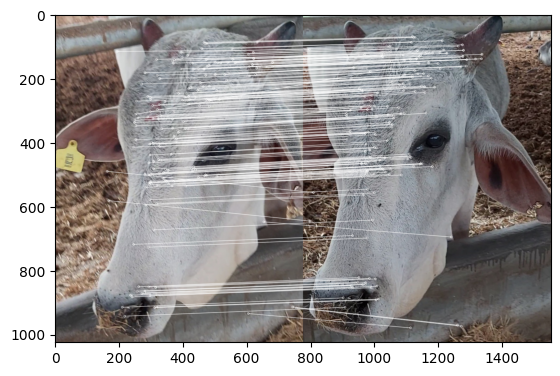

100.0
Running time: 22.18449306488037 seconds
3011 3011 3011 3011 3011
100.0


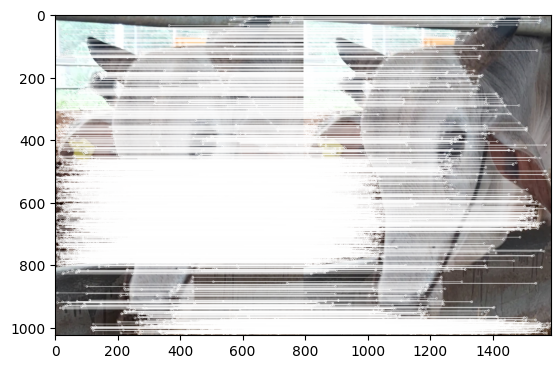

0.21043771043771042
Running time: 16.730791568756104 seconds
5 10253 2376 10253 2376
0.21043771043771042


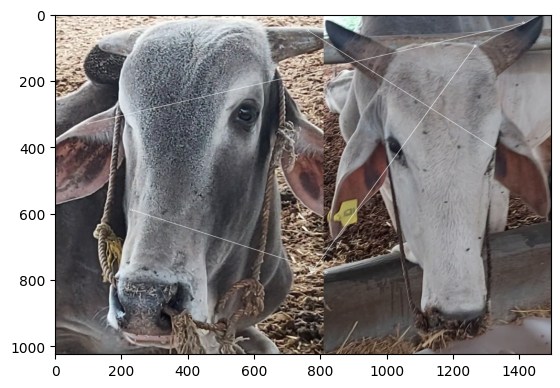

4.238559639909977
Running time: 64.05655789375305 seconds
113 2666 9293 2666 9293
4.238559639909977


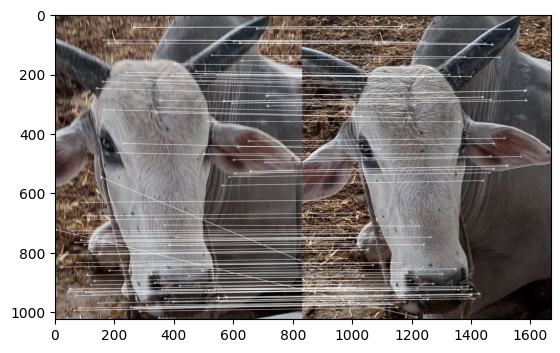

0.37064492216456635
Running time: 9.359217405319214 seconds
5 2662 1349 2662 1349
0.37064492216456635


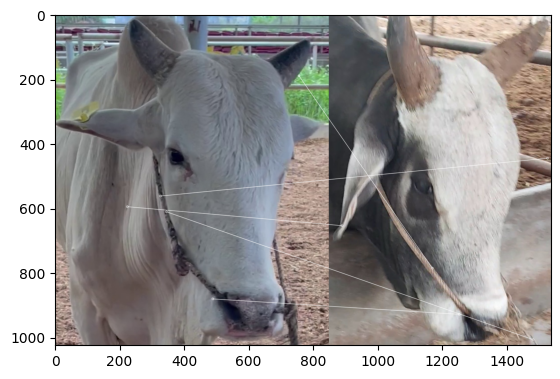

0.6395614435815441
Running time: 68.88709616661072 seconds
56 8756 10005 8756 10005
0.6395614435815441


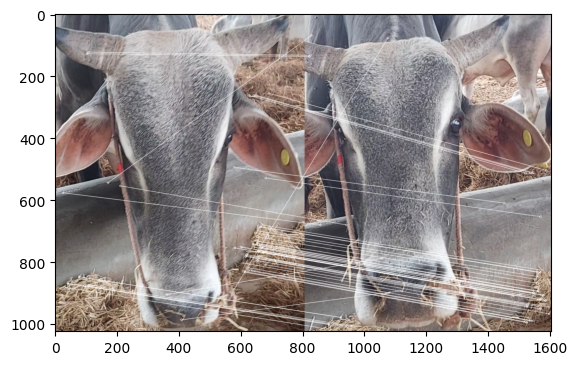

2.2968949383241175
Running time: 22.377536296844482 seconds
54 2351 3183 2351 3183
2.2968949383241175


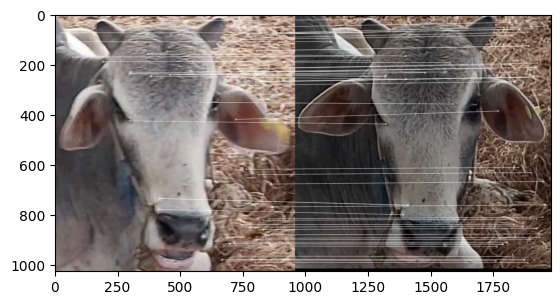

15.489021956087825
Running time: 34.26599454879761 seconds
388 2505 4903 2505 4903
15.489021956087825


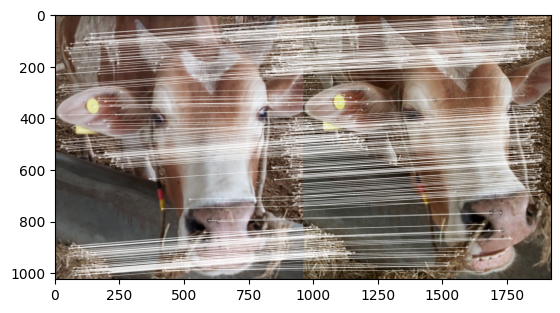

5.1653391262370265
Running time: 28.328782081604004 seconds
214 8530 4143 8530 4143
5.1653391262370265


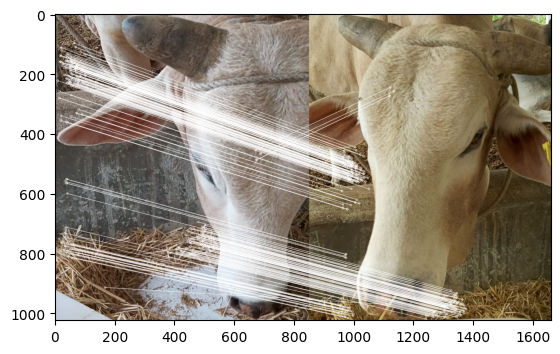

2.191780821917808
Running time: 2.932893753051758 seconds
8 1383 365 1383 365
2.191780821917808


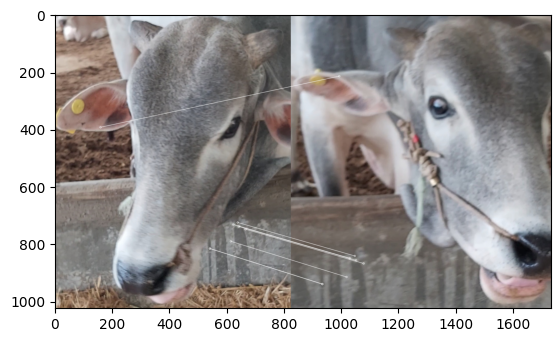

0.24752475247524752
Running time: 51.883766412734985 seconds
1 404 7206 404 7206
0.24752475247524752


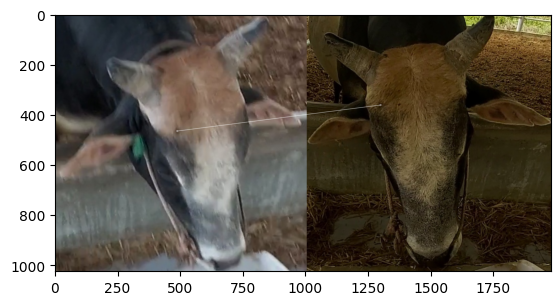

2.3041474654377883
Running time: 28.636840105056763 seconds
90 11644 3906 11644 3906
2.3041474654377883


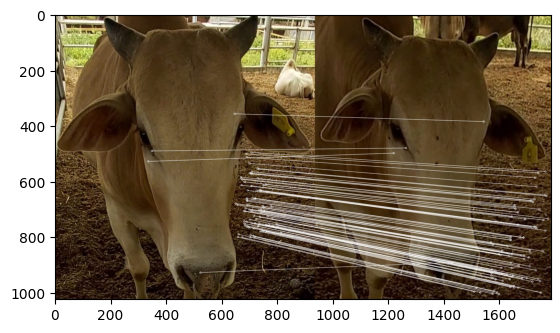

0.4056795131845842
Running time: 33.64673185348511 seconds
2 493 4730 493 4730
0.4056795131845842


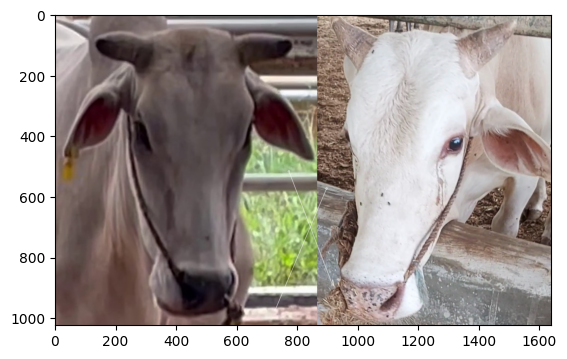

40.66701588964554
Running time: 50.82636880874634 seconds
2329 6386 5727 6386 5727
40.66701588964554


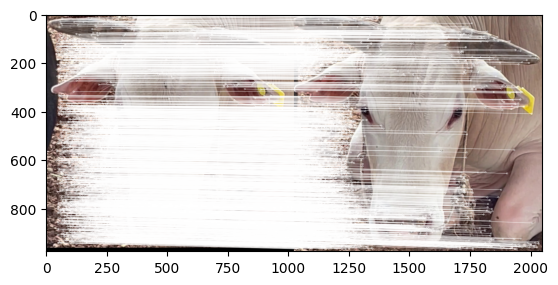

1.227830832196453
Running time: 47.448041677474976 seconds
63 8808 5131 8808 5131
1.227830832196453


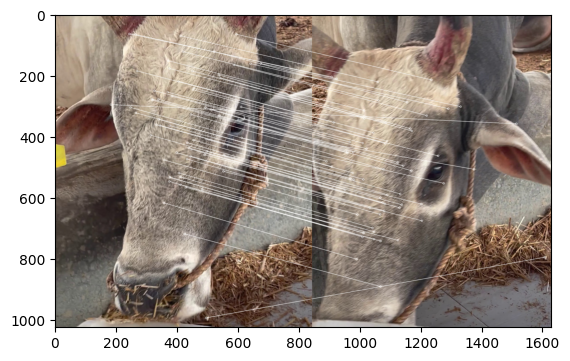

31.813216821409068
Running time: 68.47688484191895 seconds
2330 7603 7324 7603 7324
31.813216821409068


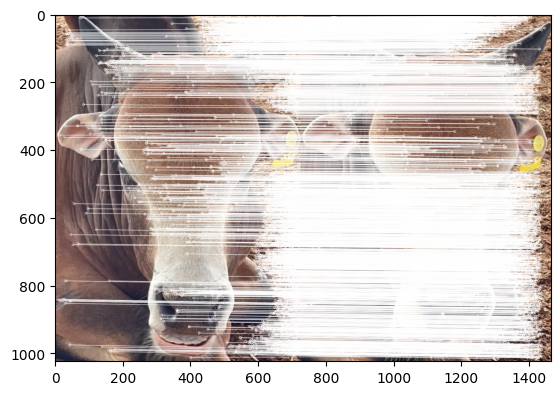

13.374108053007136
Running time: 59.75557017326355 seconds
656 4905 6529 4905 6529
13.374108053007136


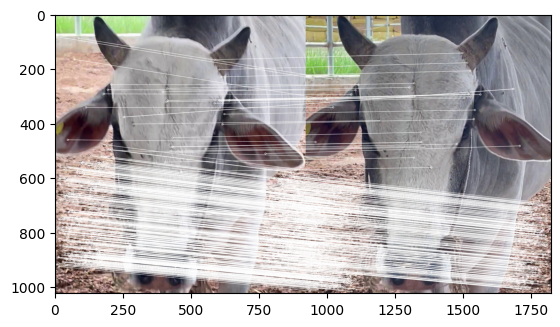

100.0
Running time: 28.219801425933838 seconds
2925 2925 2925 2925 2925
100.0


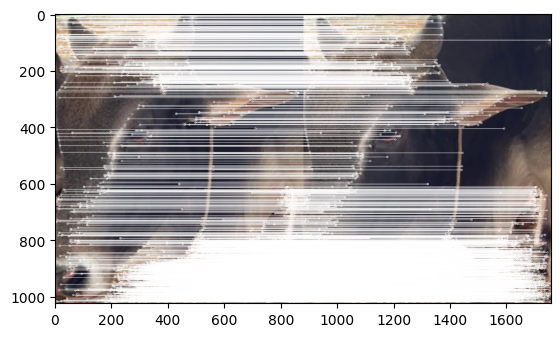

37.63955342902711
Running time: 11.644438028335571 seconds
472 1529 1254 1529 1254
37.63955342902711


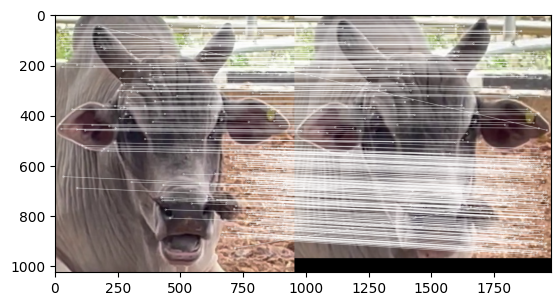

43.93472906403941
Running time: 30.278807640075684 seconds
1427 3657 3248 3657 3248
43.93472906403941


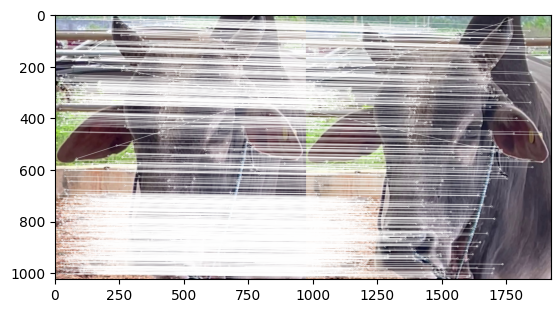

43.406418811566574
Running time: 29.73816204071045 seconds
1366 3657 3147 3657 3147
43.406418811566574


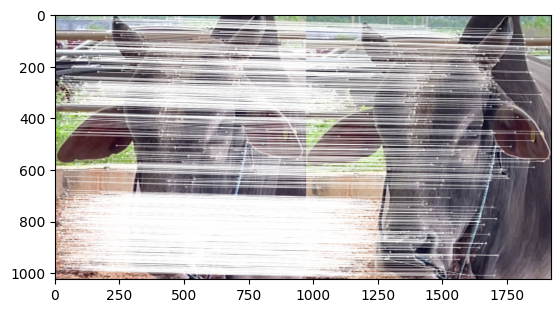

28.658722884204096
Running time: 30.831849813461304 seconds
938 3597 3273 3597 3273
28.658722884204096


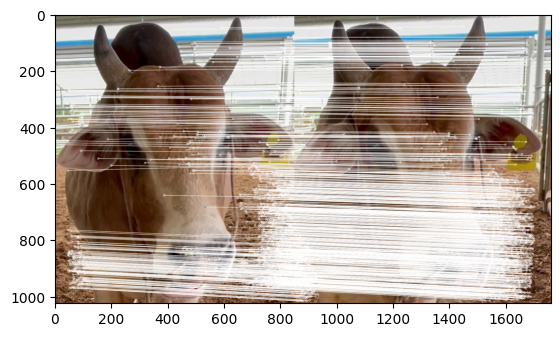

48.451327433628315
Running time: 8.583414793014526 seconds
438 904 907 904 907
48.451327433628315


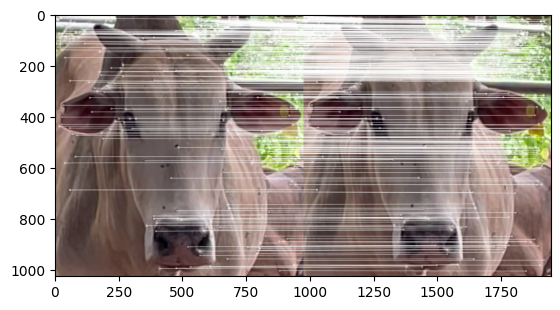

26.54639175257732
Running time: 7.332851886749268 seconds
206 904 776 904 776
26.54639175257732


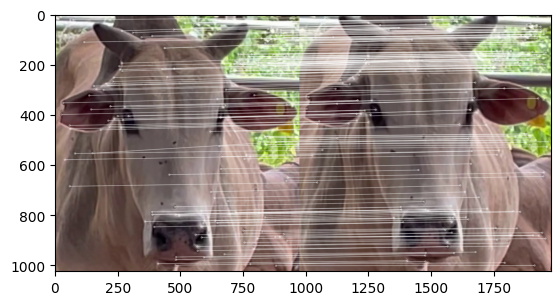

1.3761467889908259
Running time: 38.954179763793945 seconds
12 872 4257 872 4257
1.3761467889908259


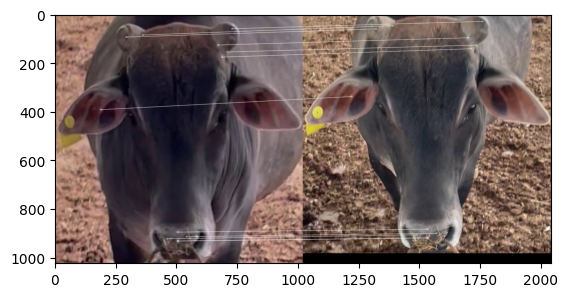

2.7053140096618358
Running time: 9.609464168548584 seconds
28 1629 1035 1629 1035
2.7053140096618358


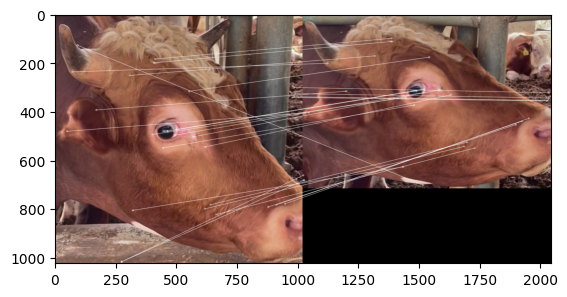

15.499306518723992
Running time: 26.576152563095093 seconds
447 3016 2884 3016 2884
15.499306518723992


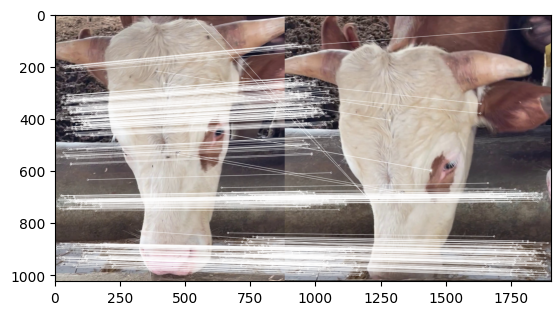

6.0344827586206895
Running time: 32.34711480140686 seconds
182 3016 3622 3016 3622
6.0344827586206895


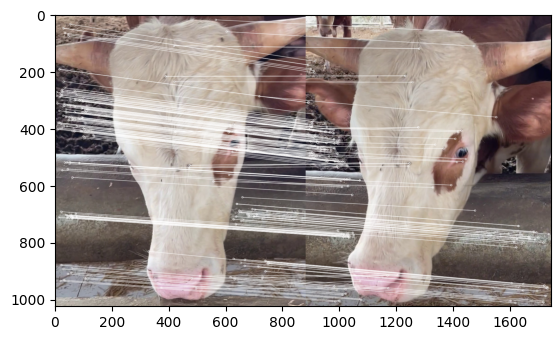

27.261286770489225
Running time: 127.75210690498352 seconds
3466 12714 14081 12714 14081
27.261286770489225


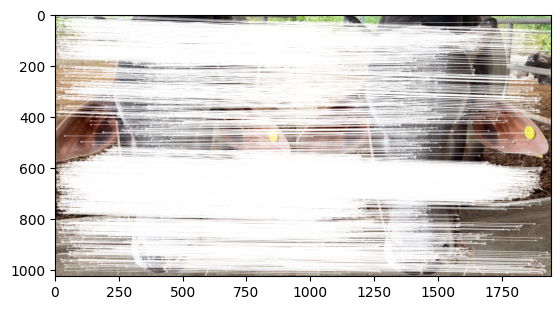

1.058914131690412
Running time: 53.364025831222534 seconds
55 5194 6844 5194 6844
1.058914131690412


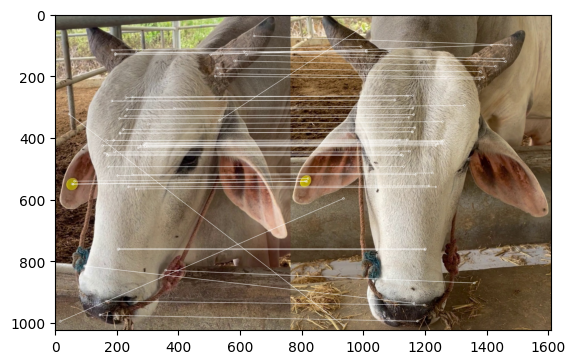

5.8424313956919445
Running time: 22.95419692993164 seconds
198 5194 3389 5194 3389
5.8424313956919445


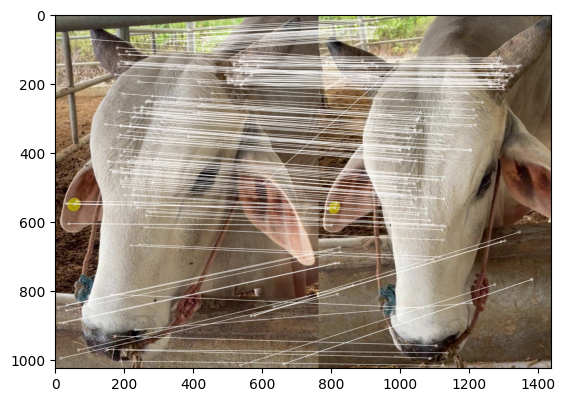

2.0579187440330964
Running time: 70.70414805412292 seconds
194 10200 9427 10200 9427
2.0579187440330964


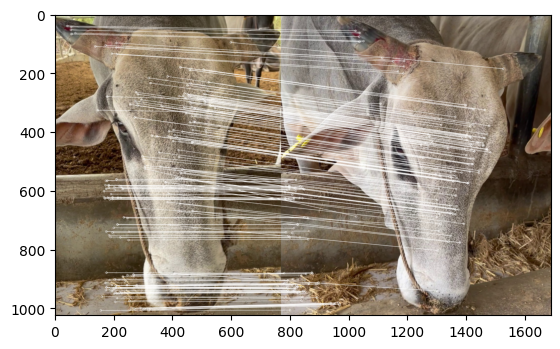

41.343896713615024
Running time: 57.90906023979187 seconds
1409 3408 6254 3408 6254
41.343896713615024


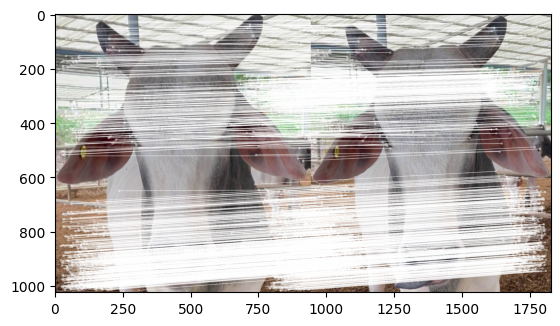

1.8763796909492272
Running time: 24.879842281341553 seconds
17 906 2760 906 2760
1.8763796909492272


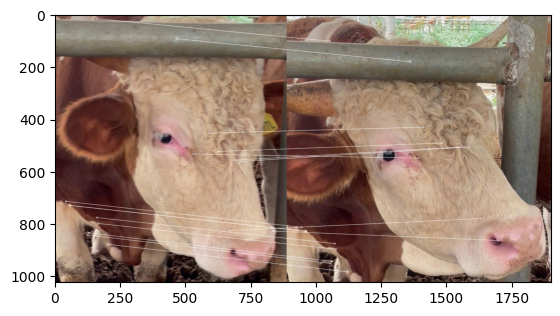

0.6493506493506493
Running time: 8.521437168121338 seconds
2 308 935 308 935
0.6493506493506493


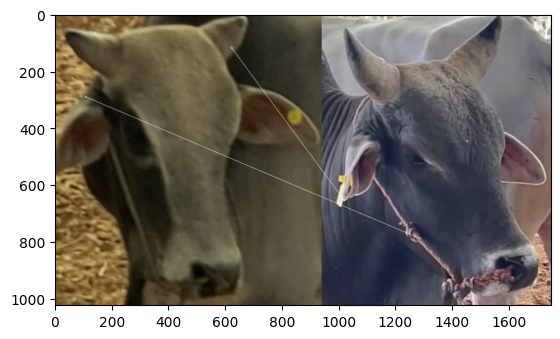

9.443099273607748
Running time: 9.690816640853882 seconds
117 1987 1239 1987 1239
9.443099273607748


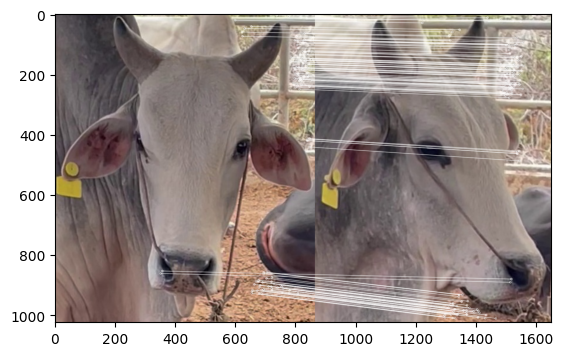

39.99386079311371


In [27]:
import time
total_time = 0
for i in range(0,50):
    start_time = time.time()
    print(getMaxScore(i))  # 88轮，一轮大概要5秒
    end_time = time.time()
    running_time = end_time - start_time
    total_time = total_time + running_time
    print("Running time:", running_time, "seconds")
    calculateResultsFor(index,i)

print(total_time/50)